In [ ]:
!pip install torch==2.0.1 torchvision==0.15.2 --index-url https://download.pytorch.org/whl/cu118
!pip install numpy==1.26.4
!pip install ultralytics

In [ ]:
# ───────────────────────────────
# 0. 掛載與資料準備
# ───────────────────────────────
import os, random, shutil
import numpy as np
import pandas as pd
from PIL import Image
from tqdm import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import transforms
from torchvision.models import efficientnet_v2_s, EfficientNet_V2_S_Weights

from sklearn.metrics import f1_score, classification_report
from ultralytics import YOLO

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# 路徑設定
base_drive = '/content/drive/MyDrive/Competition2/Competition/'
path_dataset = '/content/dataset_wall/wall_damage/'
test_folder = '/content/dataset_wall/test/'
src_dir = '/content/drive/MyDrive/Competition2/Competition/dataset_wall/wall_crack'
dst_dir = '/content/dataset_wall/wall_crack'
cls_ckpt = '/content/best_multitask_model.pth'
yolo_ckpt = '/content/runs/detect/yolov8_wall_crack_aug/weights/best.pt'
output_csv = '/content/wall_submission.csv'

os.makedirs('/content/dataset_wall', exist_ok=True)
if not os.path.exists(path_dataset):
    shutil.copytree(base_drive + 'dataset_wall/wall_damage/', path_dataset)
if not os.path.exists(test_folder):
    shutil.copytree(base_drive + 'dataset_wall/test/', test_folder)
if not os.path.exists(dst_dir):
    shutil.copytree(src_dir, dst_dir)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Mounted at /content/drive


In [ ]:
import os
from collections import Counter

# === 設定你的標註檔路徑 ===
label_folder = '/content/dataset_wall/wall_crack/train/labels'

# 用來統計每個 class_id 出現次數
class_counter = Counter()

# 逐一讀取每個 .txt 標註檔
for file_name in os.listdir(label_folder):
    if not file_name.endswith('.txt'):
        continue
    file_path = os.path.join(label_folder, file_name)
    with open(file_path, 'r') as f:
        for line in f:
            if line.strip():
                class_id = int(line.strip().split()[0])
                class_counter[class_id] += 1

# 輸出結果
print("📊 各類別（class_id）出現次數：")
for class_id, count in sorted(class_counter.items()):
    print(f"  class_id= {class_id} ：{count} 次")


📊 各類別（class_id）出現次數：
  class_id= 0 ：177 次
  class_id= 1 ：261 次
  class_id= 2 ：55 次
  class_id= 3 ：79 次
  class_id= 4 ：39 次
  class_id= 5 ：25 次


In [ ]:
# ───────────────────────────────────────────────
# ✅ 1. CNN 架構與訓練 (EfficientNetV2-S)
# ───────────────────────────────────────────────
CLASS2IDX = {'A': 0, 'B': 1, 'C': 2}
IDX2LABEL18 = {0: 18, 1: 19, 2: 20}
CRIT_BY_CLS_WALL = {
    0: [0, 2],         # Class A
    1: [3, 4, 6, 8],   # Class B
    2: [1, 5, 7, 9, 10]  # Class C
}

tf_train = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

tf_test = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

class WallDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.paths, self.cls_labels = [], []
        self.transform = transform
        for cls_name in os.listdir(root_dir):
            if cls_name not in CLASS2IDX: continue
            cls_idx = CLASS2IDX[cls_name]
            cls_folder = os.path.join(root_dir, cls_name)
            for img_name in os.listdir(cls_folder):
                if not img_name.endswith('.jpg'): continue
                self.paths.append(os.path.join(cls_folder, img_name))
                self.cls_labels.append(cls_idx)
    def __len__(self): return len(self.paths)
    def __getitem__(self, i):
        img = Image.open(self.paths[i]).convert('RGB')
        if self.transform: img = self.transform(img)
        return img, self.cls_labels[i]

class MultiTaskNet(nn.Module):
    def __init__(self):
        super().__init__()
        base = efficientnet_v2_s(weights=EfficientNet_V2_S_Weights.DEFAULT)
        self.backbone = nn.Sequential(*list(base.features))
        self.pool = nn.AdaptiveAvgPool2d(1)
        in_ch = base.classifier[1].in_features
        self.cls_head = nn.Sequential(nn.Dropout(0.5), nn.Linear(in_ch, 3))
    def forward(self, x):
        x = self.pool(self.backbone(x))
        x = torch.flatten(x, 1)
        return self.cls_head(x)

def train_cnn():
    ds = WallDataset(path_dataset, transform=tf_train)
    tr, va = random_split(ds, [int(0.8*len(ds)), len(ds)-int(0.8*len(ds))])
    tr_loader = DataLoader(tr, batch_size=16, shuffle=True)
    va_loader = DataLoader(va, batch_size=16)

    model = MultiTaskNet().cuda()
    loss_fn = nn.CrossEntropyLoss()
    opt = optim.Adam(model.parameters(), lr=3e-4)
    sch = CosineAnnealingLR(opt, T_max=20)

    for ep in range(20):
        model.train()
        for x, y in tr_loader:
            x, y = x.cuda(), y.cuda()
            opt.zero_grad()
            out = model(x)
            loss = loss_fn(out, y)
            loss.backward()
            opt.step()
        sch.step()
    torch.save(model.state_dict(), cls_ckpt)
    print('✓ CNN training finished')


In [ ]:
# ───────────────────────────────────────────────
# ✅ 2. YOLOv8 訓練
# ───────────────────────────────────────────────
import yaml

data_yaml = {
    'path': '/content/dataset_wall/wall_crack',
    'train': 'train/images',
    'val': 'train/images',
    'nc': 6,
    'names': ['0_rebar', '2_spalling', '3_xv', '4_cdiag', '6_cvert', '8_chori']
}

yaml_path = '/content/wall_crack.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f)

def train_yolo():
    !yolo task=detect mode=train model=yolov8s.pt \
        data={yaml_path} epochs=100 imgsz=640 batch=16 \
        name=yolov8_wall_crack_aug pretrained=True


In [ ]:
def predict_wall():
    from ultralytics import YOLO
    import torch
    import pandas as pd
    import os
    import cv2
    import matplotlib.pyplot as plt
    from PIL import Image

    # === 模型載入 ===
    model_cnn = MultiTaskNet().cuda()
    model_cnn.load_state_dict(torch.load(cls_ckpt))
    model_cnn.eval()
    model_yolo = YOLO(yolo_ckpt)

    # === 對應設定 ===
    class_names = [
        '0_rebar',    # 0
        '2_spalling', # 1
        '3_xv',       # 2
        '4_cdiag',    # 3
        '6_cvert',    # 4
        '8_chori'     # 5
    ]

    yolo_cls_to_crit = {
        0: 0,  # rebar
        1: 2,  # spalling
        2: 3,  # xv
        3: 4,  # cdiag
        4: 6,  # cvert
        5: 8   # chori
    }

    class_thresholds = {
        0: 0.20,
        1: 0.10,
        2: 0.10,
        3: 0.10,
        4: 0.10,
        5: 0.10
    }

    criteria_class_map = {
        18: {0, 2},           # A
        19: {3, 4, 6, 8},     # B
        20: {1}               # C
    }

    submission = []

    for i in range(1, 56):
        img_path = os.path.join(test_folder, f"{i}.jpg")
        if not os.path.exists(img_path):
            print(f"❌ 缺少圖片：{img_path}")
            submission.append([i, "20,1"])
            continue

        # CNN 預測 class label
        img = Image.open(img_path).convert('RGB')
        x = tf_test(img).unsqueeze(0).cuda()
        with torch.no_grad():
            cls_idx = torch.argmax(model_cnn(x), dim=1).item()
        cls_label = IDX2LABEL18[cls_idx]

        # 讀取圖像（cv2）畫圖用
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        criteria = []
        criteria_with_conf = []

        # === Class A：只偵測 0/1 類（rebar/spalling） ===
        if cls_label == 18:
            preds = model_yolo(img_path, conf=0.001)[0]
            for box in preds.boxes:
                yolo_cls = int(box.cls[0])
                conf = float(box.conf[0])
                if yolo_cls in [0, 1]:  # 只要 rebar or spalling
                    if conf >= class_thresholds[yolo_cls]:
                        crit_id = yolo_cls_to_crit[yolo_cls]
                        criteria.append(crit_id)
                        criteria_with_conf.append((crit_id, conf))

                        # 畫框
                        x1, y1, x2, y2 = map(int, box.xyxy[0])
                        label = f"{class_names[yolo_cls]} {conf:.2f}"
                        cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
                        cv2.putText(image, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX,
                                    0.6, (255, 0, 0), 2)

            # 保留所有符合 class 的唯一 criteria
            criteria = sorted(set(c for c, _ in criteria_with_conf if c in criteria_class_map[cls_label]))


        # === Class C：固定為 no significant damage（criteria=1） ===
        elif cls_label == 20:
            criteria = [10]

        # === Class B：完整跑 YOLO（條件篩選、畫框、分類決策） ===
        else:
            preds = model_yolo(img_path, conf=0.001)[0]
            for box in preds.boxes:
                yolo_cls = int(box.cls[0])
                conf = float(box.conf[0])
                if yolo_cls in yolo_cls_to_crit:
                    if conf >= class_thresholds[yolo_cls]:
                        crit_id = yolo_cls_to_crit[yolo_cls]
                        criteria.append(crit_id)
                        criteria_with_conf.append((crit_id, conf))

                        x1, y1, x2, y2 = map(int, box.xyxy[0])
                        label = f"{class_names[yolo_cls]} {conf:.2f}"
                        cv2.rectangle(image, (x1, y1), (x2, y2), (255, 0, 0), 2)
                        cv2.putText(image, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX,
                                    0.6, (255, 0, 0), 2)

            if 0 in criteria:
                cls_label = 18
                criteria = [0]
            elif criteria_with_conf:
                top_crit = sorted(criteria_with_conf, key=lambda x: -x[1])[0][0]
                for cls_id, valid in criteria_class_map.items():
                    if top_crit in valid:
                        cls_label = cls_id
                        break
                criteria = sorted({c for c, _ in criteria_with_conf if c in criteria_class_map[cls_label]})
            else:
                cls_label = 20
                criteria = [10]

        # === 顯示圖片 ===
        plt.figure(figsize=(8, 5))
        plt.imshow(image)
        plt.axis('off')
        plt.title(f"Image {i}.jpg → class={cls_label}, criteria={criteria}")
        plt.show()

        # === 輸出到 CSV 結果中 ===
        cls_str = f"{cls_label}," + ",".join(str(c) for c in criteria)
        submission.append([i, cls_str])

    # === 寫入 CSV ===
    df = pd.DataFrame(submission, columns=["ID", "class"])
    df.to_csv(output_csv, index=False)
    print(f"✅ 輸出成功：{output_csv}")


In [ ]:
train_cnn()


Downloading: "https://download.pytorch.org/models/efficientnet_v2_s-dd5fe13b.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_v2_s-dd5fe13b.pth
100%|██████████| 82.7M/82.7M [00:01<00:00, 76.4MB/s]


✓ CNN training finished


In [ ]:
train_yolo()


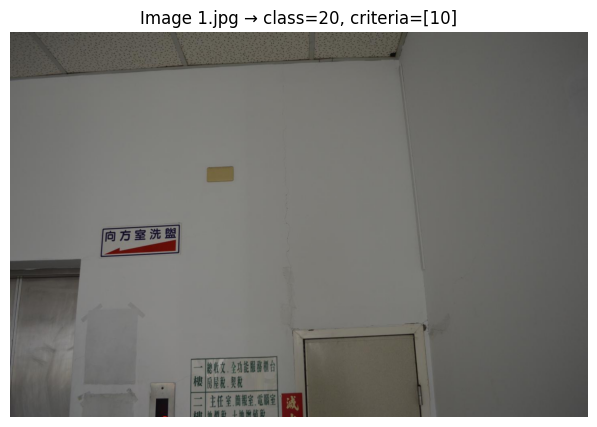


image 1/1 /content/dataset_wall/test/2.jpg: 640x640 1 0_rebar, 16 2_spallings, 1 6_cvert, 17.0ms
Speed: 1.9ms preprocess, 17.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


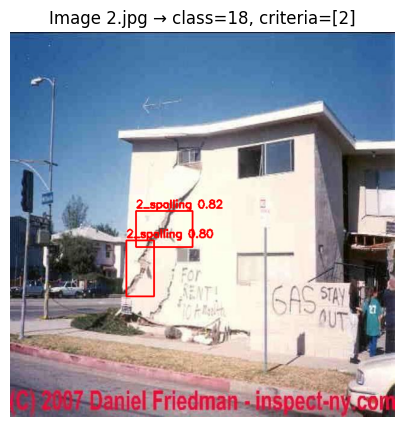


image 1/1 /content/dataset_wall/test/3.jpg: 640x480 3 4_cdiags, 12.8ms
Speed: 3.1ms preprocess, 12.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


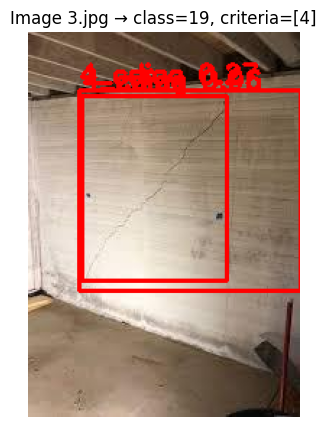

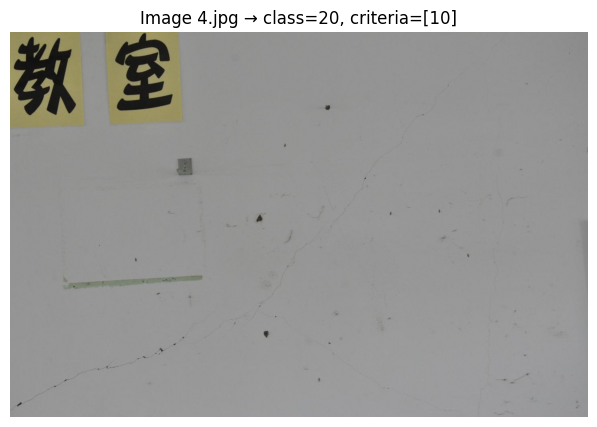

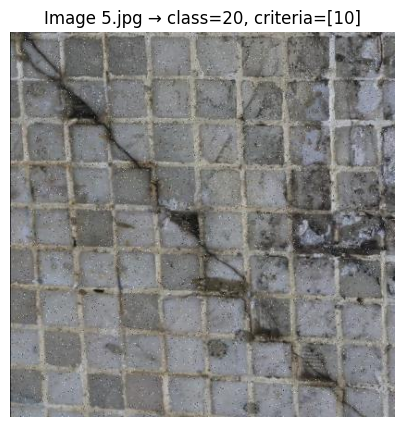

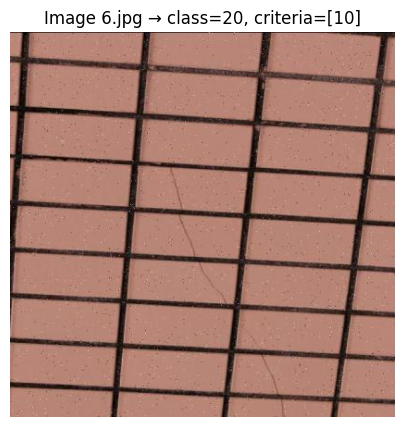


image 1/1 /content/dataset_wall/test/7.jpg: 640x640 1 2_spalling, 7 3_xvs, 6 4_cdiags, 18 8_choris, 17.4ms
Speed: 1.9ms preprocess, 17.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


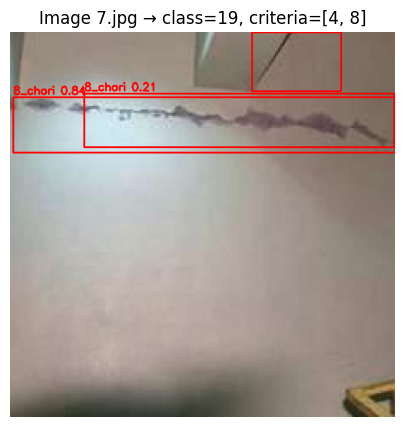


image 1/1 /content/dataset_wall/test/8.jpg: 640x640 19 0_rebars, 2 2_spallings, 5 3_xvs, 5 4_cdiags, 1 6_cvert, 16.3ms
Speed: 2.2ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


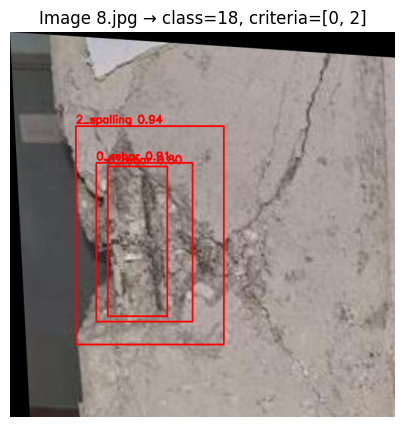


image 1/1 /content/dataset_wall/test/9.jpg: 640x640 13 0_rebars, 20 2_spallings, 15 3_xvs, 8 4_cdiags, 16.3ms
Speed: 2.7ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


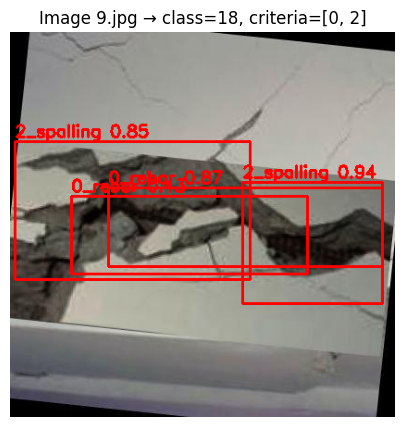


image 1/1 /content/dataset_wall/test/10.jpg: 640x640 39 2_spallings, 1 4_cdiag, 2 6_cverts, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


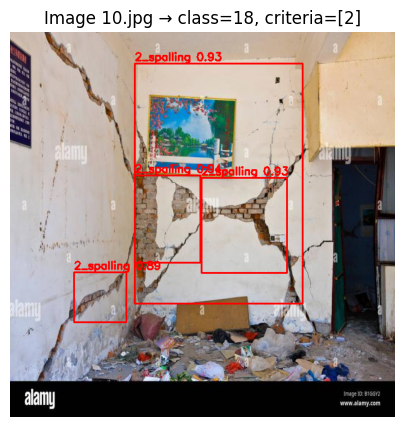

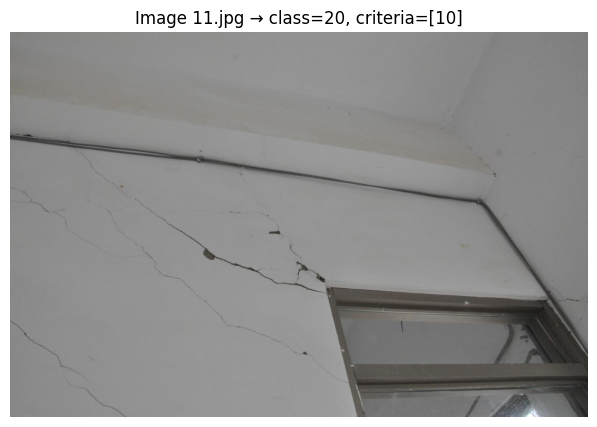

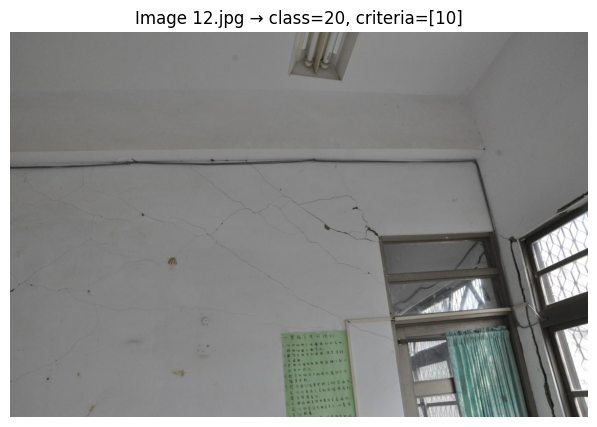


image 1/1 /content/dataset_wall/test/13.jpg: 640x640 41 0_rebars, 27 2_spallings, 2 3_xvs, 1 4_cdiag, 3 6_cverts, 1 8_chori, 16.3ms
Speed: 1.8ms preprocess, 16.3ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)


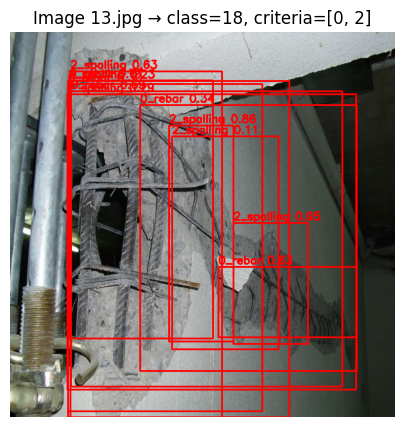


image 1/1 /content/dataset_wall/test/14.jpg: 480x640 1 3_xv, 23 4_cdiags, 21 8_choris, 13.6ms
Speed: 2.0ms preprocess, 13.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


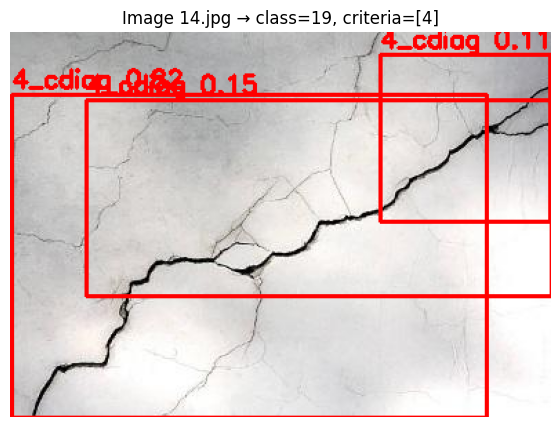


image 1/1 /content/dataset_wall/test/15.jpg: 640x640 7 3_xvs, 7 4_cdiags, 8 6_cverts, 2 8_choris, 17.1ms
Speed: 1.7ms preprocess, 17.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


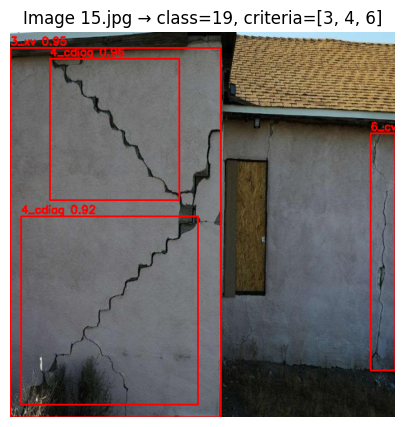


image 1/1 /content/dataset_wall/test/16.jpg: 640x640 1 0_rebar, 6 2_spallings, 5 3_xvs, 11 4_cdiags, 6 6_cverts, 16.3ms
Speed: 2.5ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


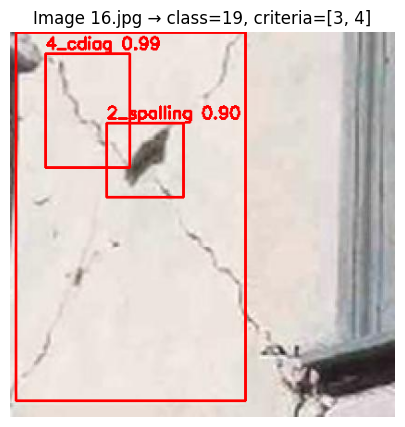

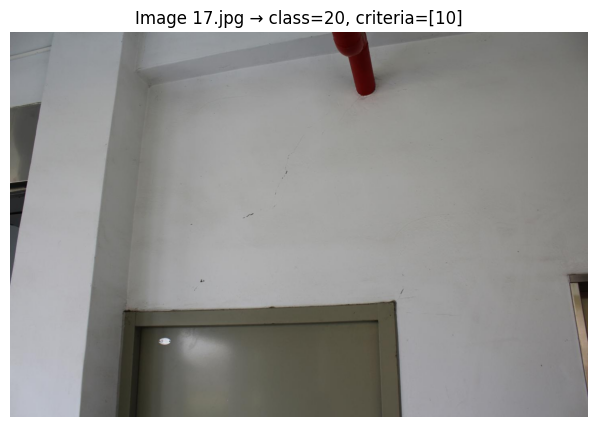

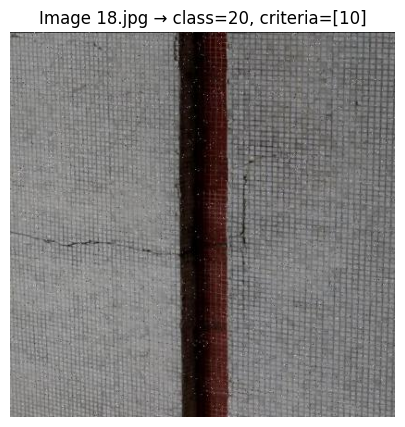


image 1/1 /content/dataset_wall/test/19.jpg: 640x640 9 0_rebars, 28 2_spallings, 1 4_cdiag, 16.3ms
Speed: 1.8ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


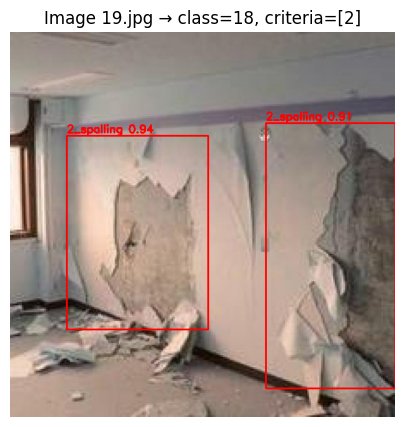


image 1/1 /content/dataset_wall/test/20.jpg: 640x640 1 3_xv, 7 4_cdiags, 1 8_chori, 16.4ms
Speed: 1.8ms preprocess, 16.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


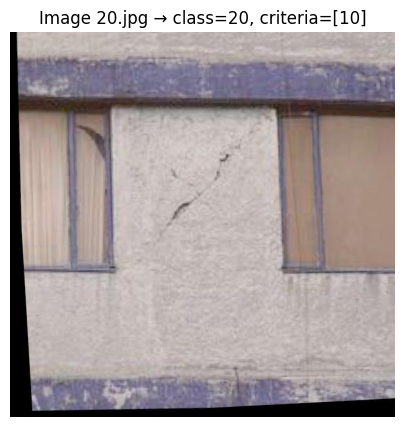


image 1/1 /content/dataset_wall/test/21.jpg: 640x640 10 0_rebars, 6 2_spallings, 16.3ms
Speed: 3.9ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


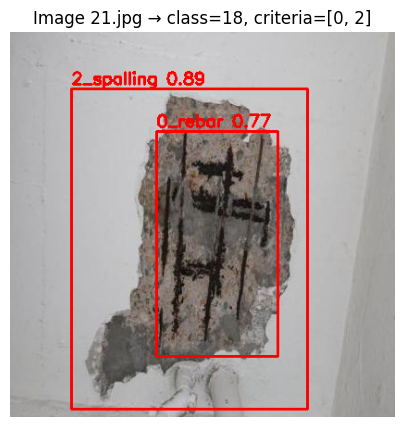


image 1/1 /content/dataset_wall/test/22.jpg: 640x640 8 2_spallings, 8 3_xvs, 14 4_cdiags, 2 6_cverts, 4 8_choris, 16.3ms
Speed: 2.7ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


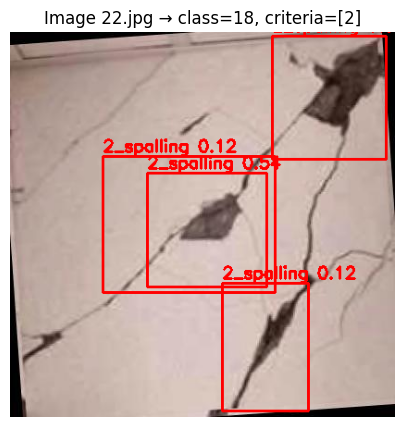

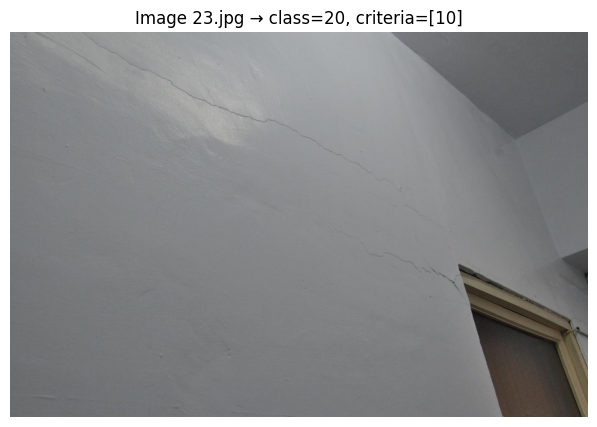


image 1/1 /content/dataset_wall/test/24.jpg: 640x640 1 0_rebar, 20 2_spallings, 19 3_xvs, 10 4_cdiags, 5 8_choris, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


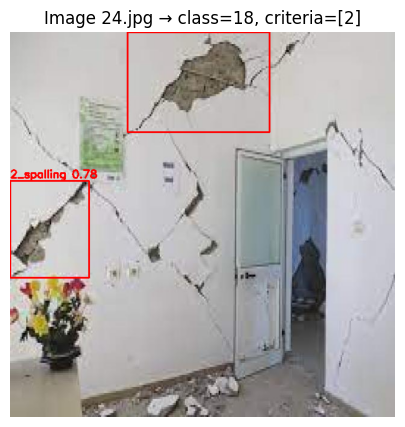


image 1/1 /content/dataset_wall/test/25.jpg: 640x640 21 0_rebars, 32 2_spallings, 1 6_cvert, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


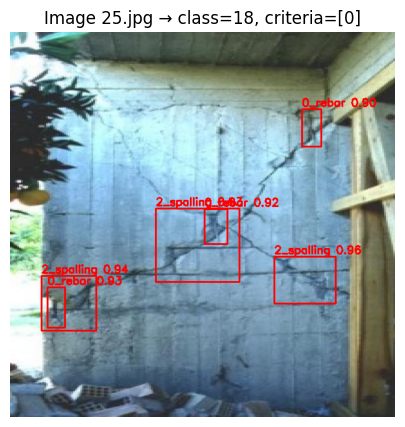


image 1/1 /content/dataset_wall/test/26.jpg: 640x640 3 0_rebars, 49 2_spallings, 8 8_choris, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


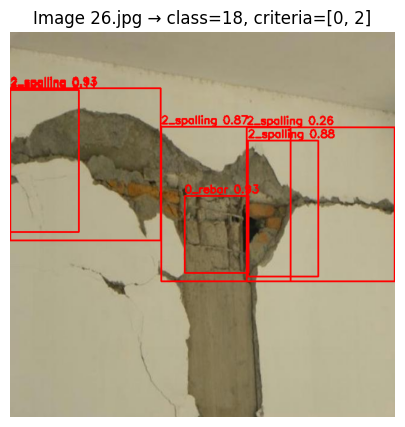

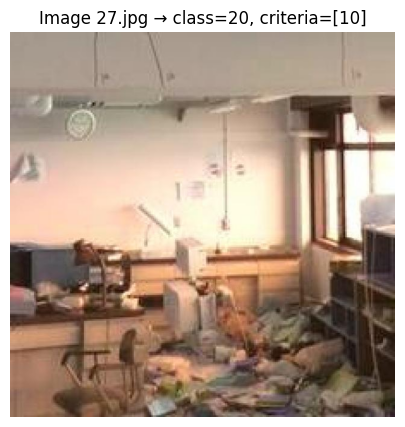

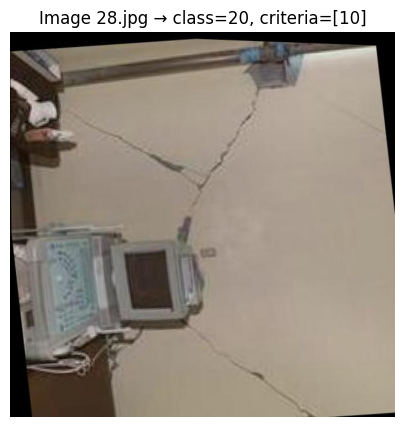


image 1/1 /content/dataset_wall/test/29.jpg: 448x640 4 0_rebars, 16 2_spallings, 5 3_xvs, 6 6_cverts, 13.6ms
Speed: 2.9ms preprocess, 13.6ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


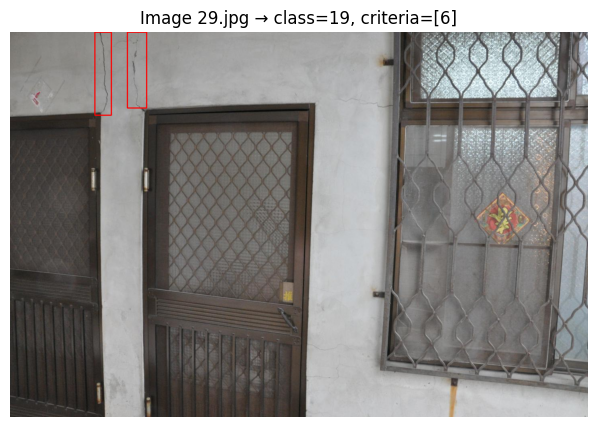


image 1/1 /content/dataset_wall/test/30.jpg: 640x640 13 0_rebars, 7 2_spallings, 17.0ms
Speed: 2.9ms preprocess, 17.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


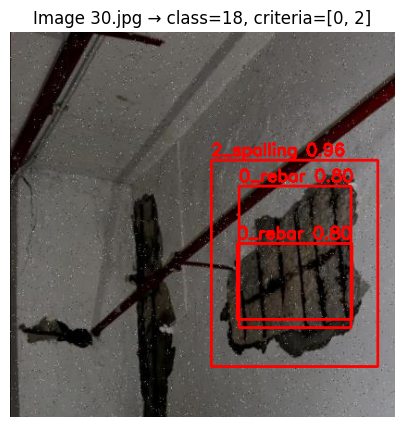

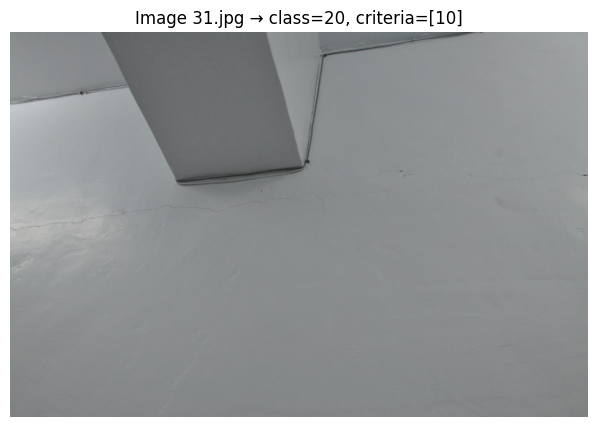


image 1/1 /content/dataset_wall/test/32.jpg: 640x640 33 0_rebars, 73 2_spallings, 16.3ms
Speed: 2.0ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


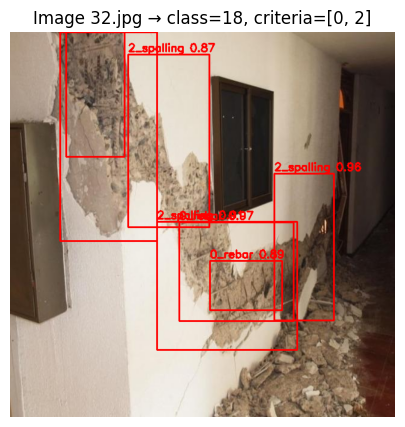

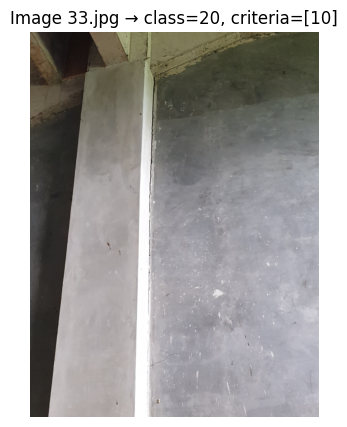

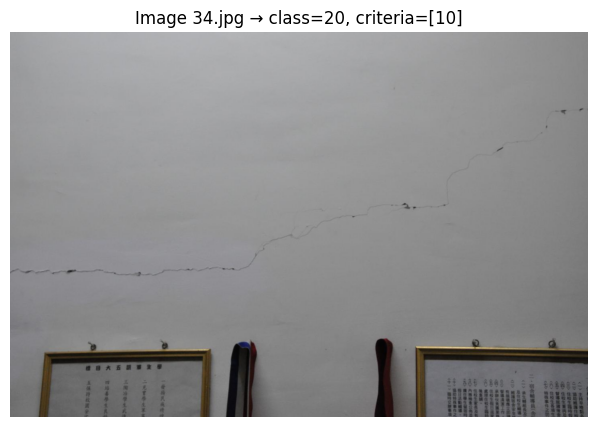

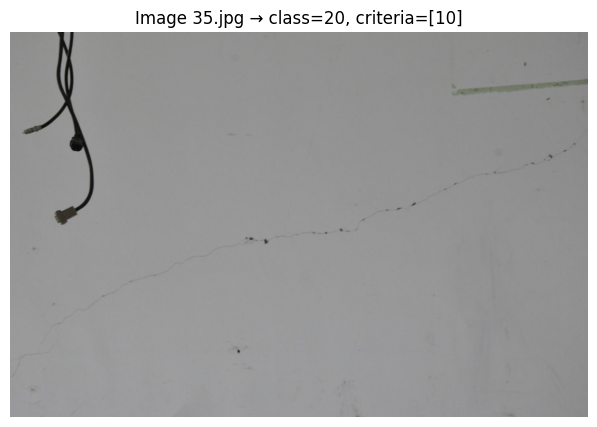


image 1/1 /content/dataset_wall/test/36.jpg: 640x640 16 0_rebars, 9 2_spallings, 1 3_xv, 4 4_cdiags, 2 6_cverts, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


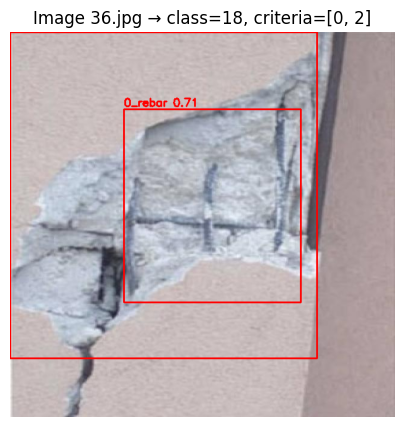


image 1/1 /content/dataset_wall/test/37.jpg: 640x640 18 0_rebars, 34 2_spallings, 1 3_xv, 16.3ms
Speed: 2.6ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


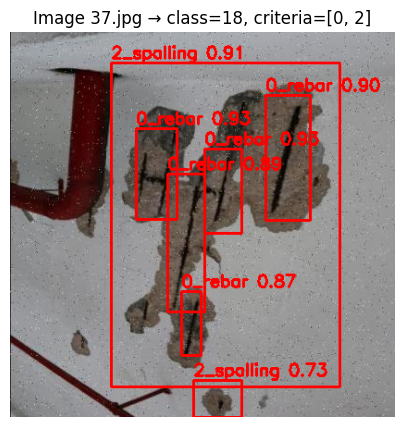


image 1/1 /content/dataset_wall/test/38.jpg: 640x640 21 0_rebars, 75 2_spallings, 2 8_choris, 16.6ms
Speed: 2.0ms preprocess, 16.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


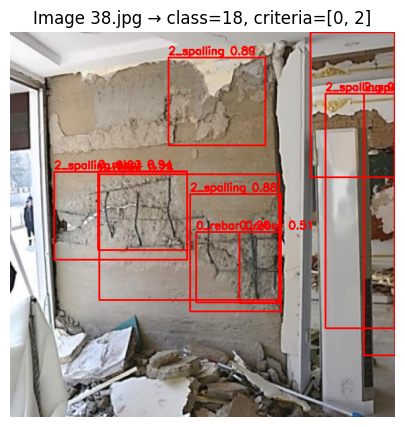


image 1/1 /content/dataset_wall/test/39.jpg: 640x640 9 2_spallings, 1 6_cvert, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


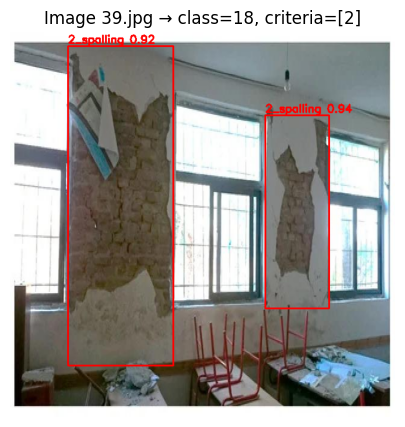


image 1/1 /content/dataset_wall/test/40.jpg: 640x640 14 0_rebars, 7 2_spallings, 3 3_xvs, 1 4_cdiag, 1 8_chori, 16.3ms
Speed: 2.6ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


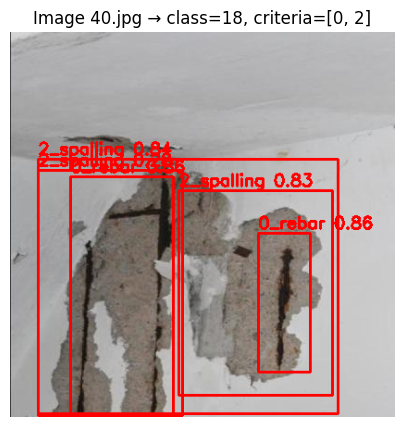


image 1/1 /content/dataset_wall/test/41.jpg: 640x640 12 0_rebars, 8 2_spallings, 6 3_xvs, 10 4_cdiags, 3 6_cverts, 16.3ms
Speed: 1.8ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


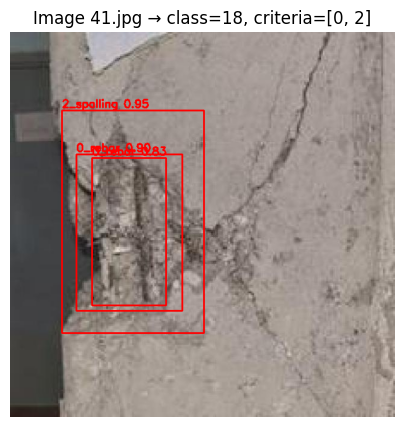


image 1/1 /content/dataset_wall/test/42.jpg: 640x480 4 0_rebars, 8 2_spallings, 1 3_xv, 2 4_cdiags, 9 6_cverts, 5 8_choris, 13.0ms
Speed: 3.4ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


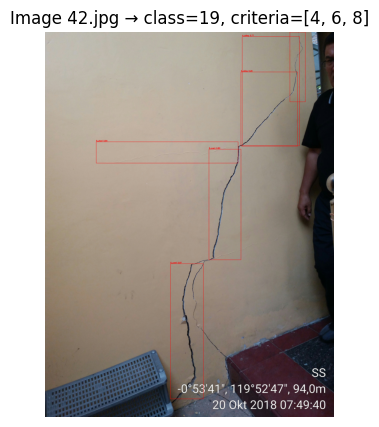

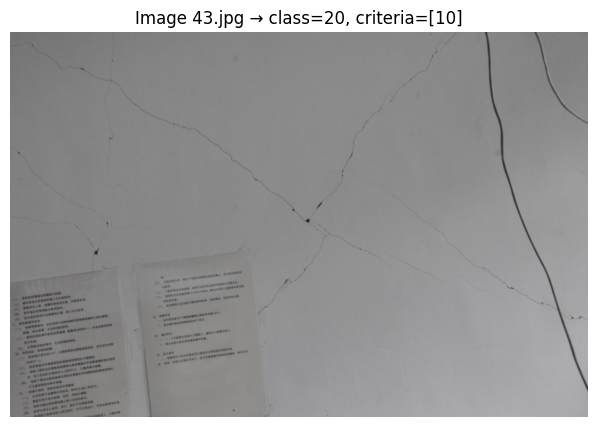

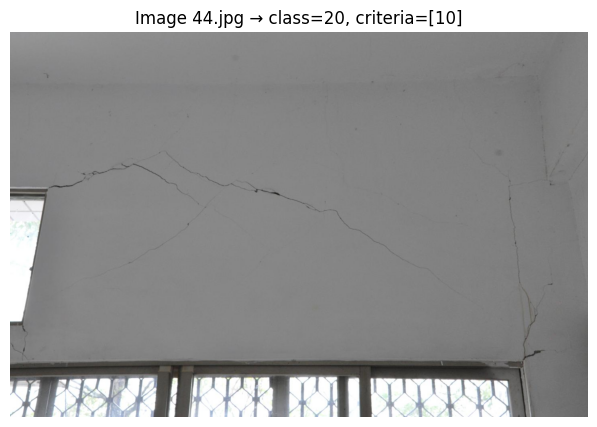


image 1/1 /content/dataset_wall/test/45.jpg: 640x640 10 0_rebars, 11 2_spallings, 2 8_choris, 17.0ms
Speed: 1.9ms preprocess, 17.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


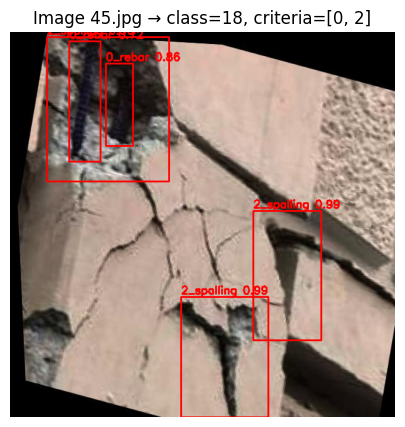

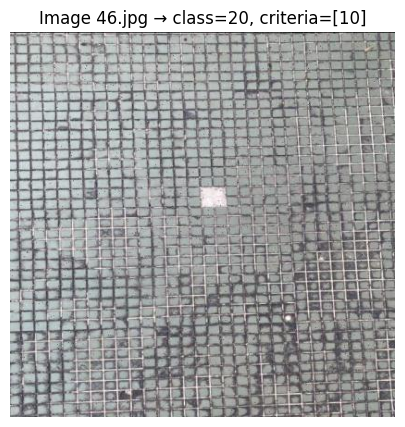


image 1/1 /content/dataset_wall/test/47.jpg: 640x640 14 0_rebars, 18 2_spallings, 1 6_cvert, 1 8_chori, 16.4ms
Speed: 2.9ms preprocess, 16.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


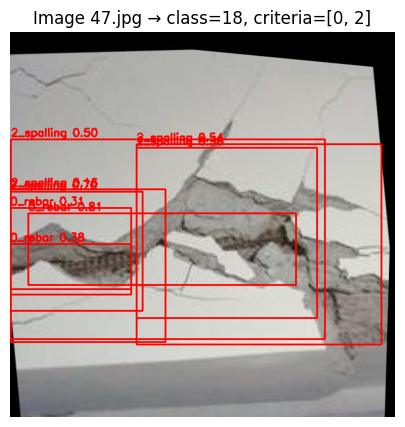

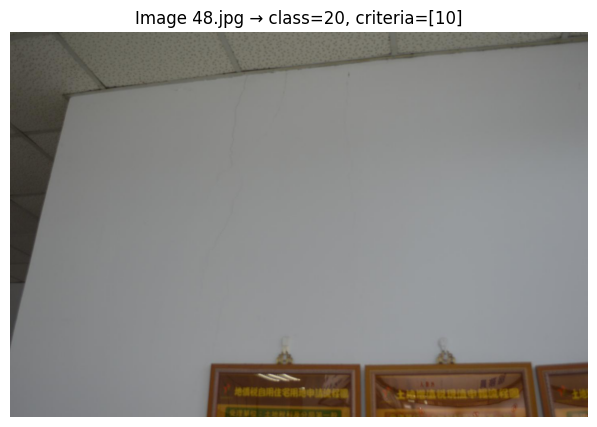


image 1/1 /content/dataset_wall/test/49.jpg: 640x640 2 0_rebars, 18 2_spallings, 4 3_xvs, 1 8_chori, 16.3ms
Speed: 1.9ms preprocess, 16.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


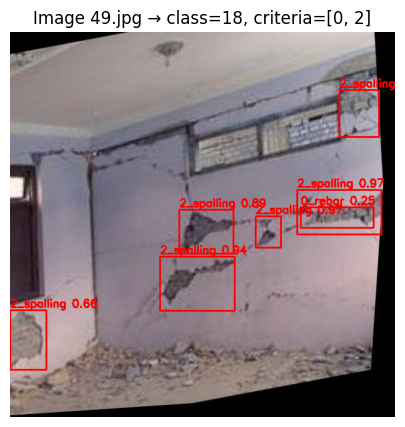


image 1/1 /content/dataset_wall/test/50.jpg: 640x640 42 0_rebars, 63 2_spallings, 1 4_cdiag, 3 6_cverts, 1 8_chori, 16.3ms
Speed: 2.9ms preprocess, 16.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


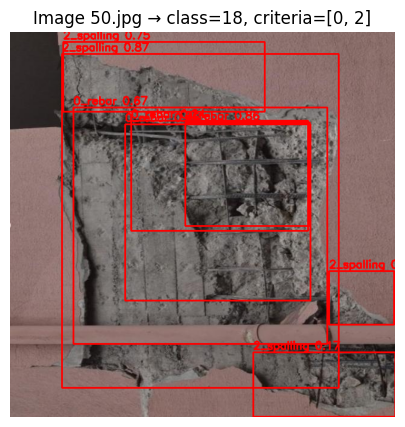


image 1/1 /content/dataset_wall/test/51.jpg: 512x640 1 0_rebar, 1 2_spalling, 2 3_xvs, 4 4_cdiags, 11 6_cverts, 13.9ms
Speed: 2.2ms preprocess, 13.9ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)


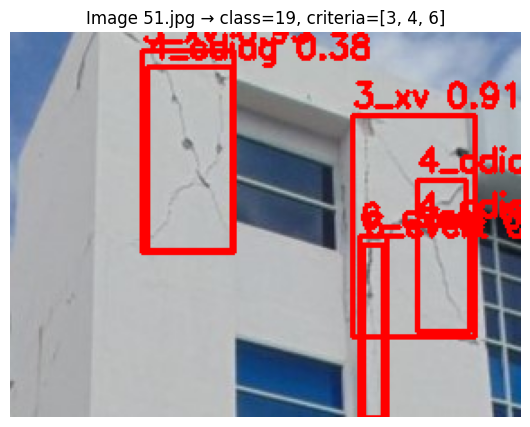


image 1/1 /content/dataset_wall/test/52.jpg: 640x640 45 0_rebars, 26 2_spallings, 17.1ms
Speed: 2.8ms preprocess, 17.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


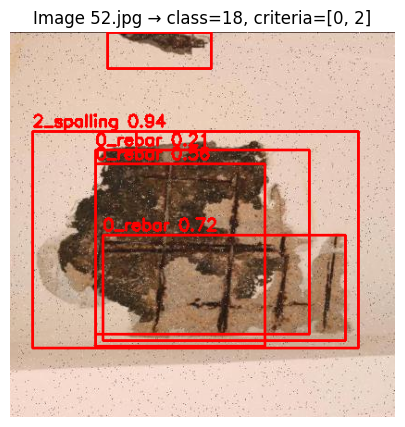


image 1/1 /content/dataset_wall/test/53.jpg: 640x640 42 0_rebars, 33 2_spallings, 1 8_chori, 16.4ms
Speed: 4.5ms preprocess, 16.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


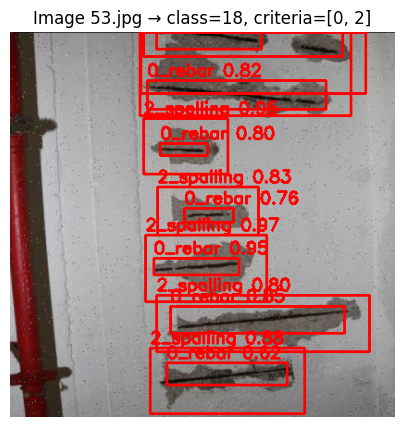

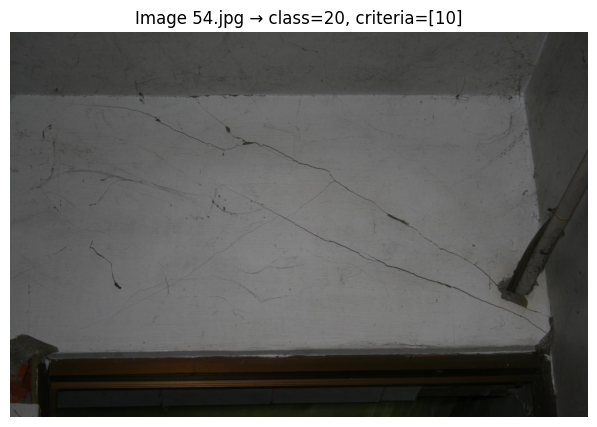


image 1/1 /content/dataset_wall/test/55.jpg: 640x640 7 0_rebars, 49 2_spallings, 2 3_xvs, 3 4_cdiags, 7 6_cverts, 16.5ms
Speed: 1.9ms preprocess, 16.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


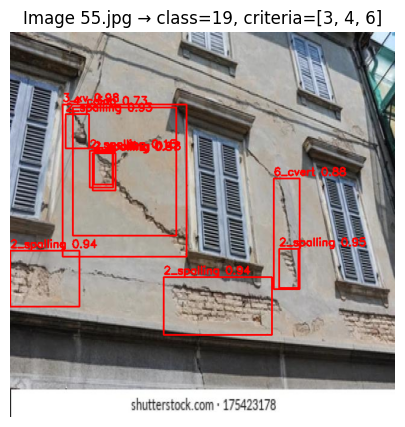

✅ 輸出成功：/content/wall_submission.csv


In [ ]:
predict_wall()
